In [42]:
%matplotlib inline 


import numpy as np #To use functions or constants that are in the NumPy module, type np.function_name. EG: np.pi is pi
import numpy.random as nprd #This imports random number generation functions
import scipy as sp #SciPy has lots of useful numerical methods, so we don't have to write them
import scipy.linalg as spla #This imports the sub-module containing linear algebra methods
import matplotlib.pyplot as plt #This will let us display images nicely
import cv2
#import pandas as pd 
from scipy import ndimage
from sklearn.feature_extraction import image
from sklearn.cluster import spectral_clustering


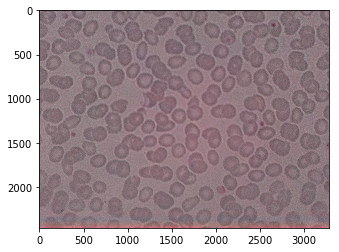

In [43]:
img = cv2.imread('C:\\Users\\SAMBa_Student\\Documents\\GitHub\\Malaria-Imaging-Code\\Full Images\\0_0.jpg')
plt.imshow(img)
plt.show()


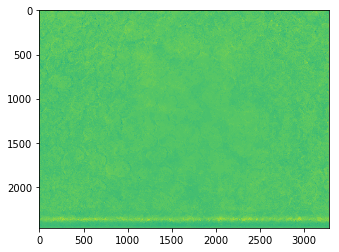

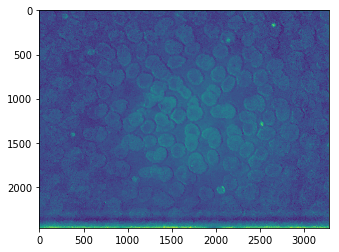

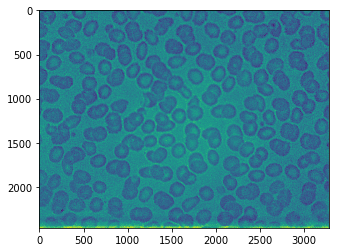

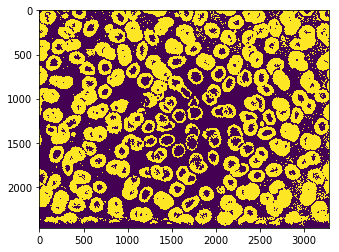

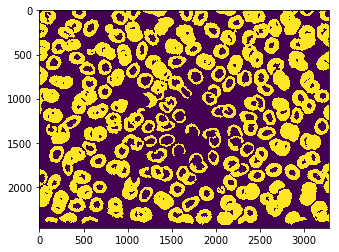

In [44]:
def small_thing_removal(img,min_area):
    label_img, cc_num = ndimage.label(img)
    CC = ndimage.find_objects(img)
    cc_areas = ndimage.sum(img, label_img, range(cc_num+1))
    area_mask = (cc_areas < min_area)
    img[area_mask[label_img]] = 0
    return(np.uint8(img))
    
def crop_minAreaRect(img, rect):

    # rotate img
    angle = rect[2]
    rows,cols = img.shape[0], img.shape[1]
    M = cv2.getRotationMatrix2D((cols/2,rows/2),angle,1)
    img_rot = cv2.warpAffine(img,M,(cols,rows))

    # rotate bounding box
    rect0 = (rect[0], rect[1], 0.0)
    box = cv2.boxPoints(rect)
    pts = np.int0(cv2.transform(np.array([box]), M))[0]    
    pts[pts < 0] = 0

    # crop
    img_crop = img_rot[pts[1][1]:pts[0][1], 
                       pts[1][0]:pts[2][0]]

    return img_crop



## Convert to HSV colour space 
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
img_h=img_hsv[:,:,0]
img_s=img_hsv[:,:,1]
img_v=img_hsv[:,:,2]

plt.imshow(img_h)
plt.show()
plt.imshow(img_s)
plt.show()
plt.imshow(img_v)
plt.show()

blur = cv2.GaussianBlur(img_v,(3,3),0)
ret_v,th_v = cv2.threshold(255-blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.imshow(th_v)
plt.show()

kernel1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
opening_v = cv2.morphologyEx(th_v, cv2.MORPH_OPEN, kernel1)
opening_v=small_thing_removal(opening_v,5000*255)
kernel2= cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(11,11))
closing_v = cv2.morphologyEx(opening_v, cv2.MORPH_CLOSE, kernel1)
plt.imshow(closing_v)
plt.show()



C:\Users\SAMBa_Student\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:3285: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  'bottom=%s, top=%s') % (bottom, top))


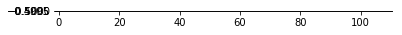

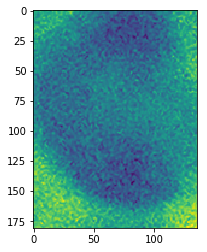

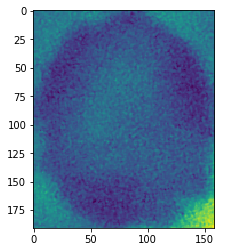

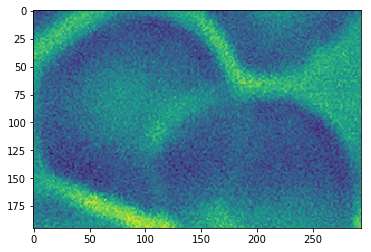

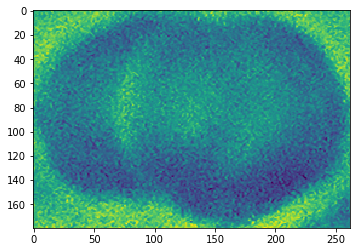

...

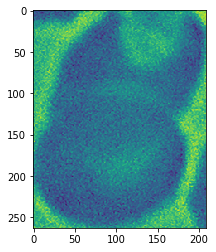

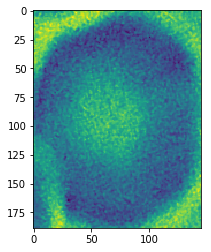

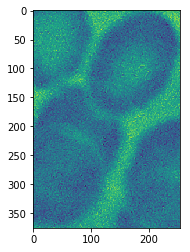

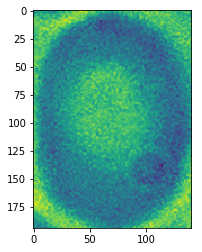

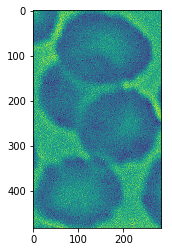

C:\Users\SAMBa_Student\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: RuntimeWarning: overflow encountered in ushort_scalars


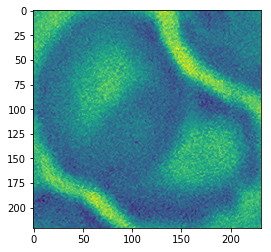

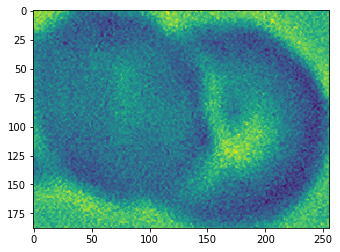

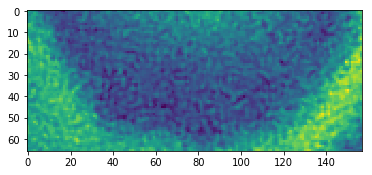

C:\Users\SAMBa_Student\Anaconda3\lib\site-packages\ipykernel_launcher.py:36: RuntimeWarning: overflow encountered in ushort_scalars


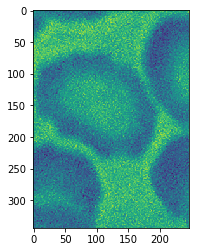

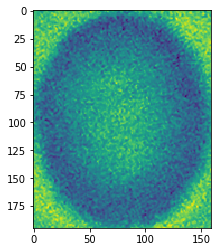

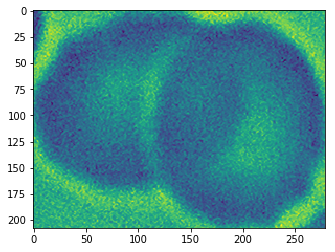

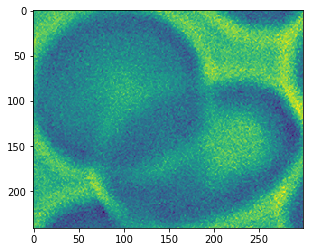

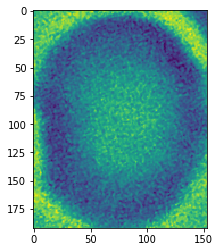

...

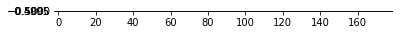

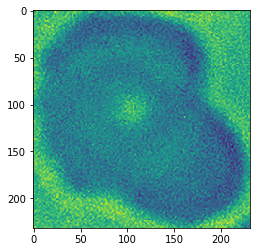

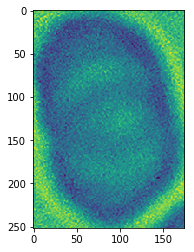

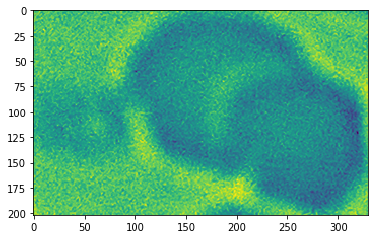

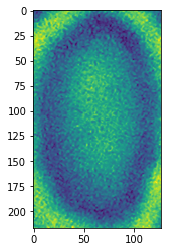

C:\Users\SAMBa_Student\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:2961: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=-0.5, right=-0.5
  'left=%s, right=%s') % (left, right))


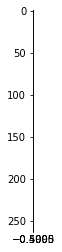

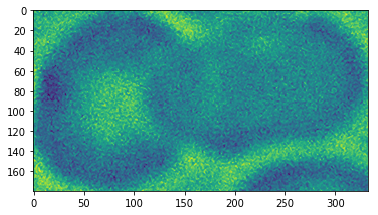

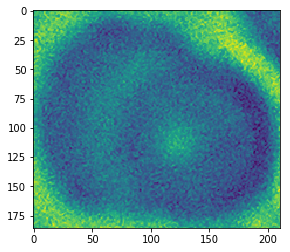

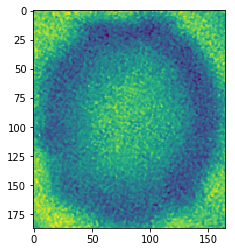

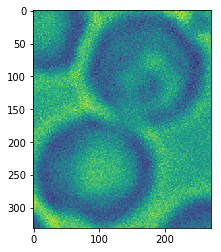

...

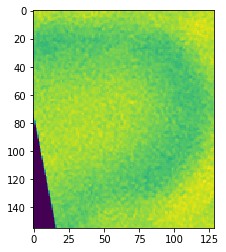

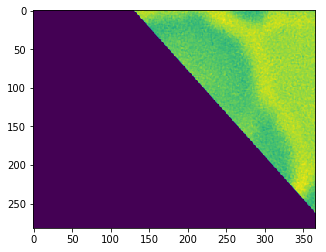

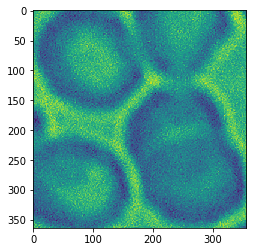

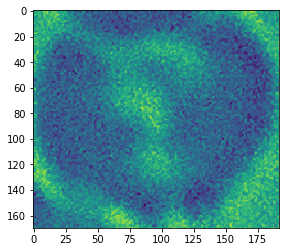

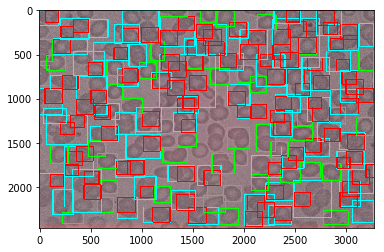

In [16]:

pictures = {}
multidict={}
contourdict={}
pointdict={}
number=0
contours = cv2.findContours(closing_v, 1, 2)
for i in range(np.shape(contours[1])[0]):
    cnt = contours[1][i]
    x,y,w,h = cv2.boundingRect(cnt)

    area=cv2.contourArea(cnt)
    

 
    if 25000>area>12000:
        ellipse = cv2.fitEllipse(cnt)
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),10)
        img_new=crop_minAreaRect(img_v, ellipse)  #  cv2.imwrite ('H:\\dos\\Reading Courses\\Malaria Imaging\\cropped_images\\0_1_crop'+str(i)+'.tiff',  img_new)
        pictures[number] = img_new
        number=number+1
        plt.imshow(img_new)
        plt.show()
    elif area>25000:
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,255),10)
        #print(x,y)
        img_new=img_v[int(y):int(y+h),int(x):int(x+w)]
        cv2.imwrite ('C:\\Users\\SAMBa_Student\\Documents\\GitHub\\Malaria-Imaging-Code\\Multi_cell_images\\0_1_crop'+str(i)+'.jpg',  img_new)
        multidict[i]=img_new
        contourdict[i]=cnt
        pointdict[i]=[x,y,w,h]
        #print(img_new)
        circles =hough(img_new)
        #print(circles)
        for j in range(np.shape(circles)[0]):
            x1=circles[j,0]-circles[j,2]
            y1=circles[j,1]-circles[j,2]
            h1=circles[j,2]*2
            w1=circles[j,2]*2
            #cv2.rectangle(img_new,np.array([int(x1),int(y1)]),np.array([int(x1+w),int(y1+h)]),255,10)
            cv2.rectangle(img,(int(x+x1),int(y+y1)),(int(x+x1+w1),int(y+y1+h1)),(255,0,0),10)
            img1=img_v[int(y+y1)-10:int(y+y1+h1)+10,int(x+x1)-10:int(x+x1+w1)+10]
            #print('here', img1)
            pictures[number] = img1
            number=number+1

        plt.imshow(img_new)
        plt.show()


plt.imshow(img,aspect='auto')
plt.show()

In [47]:
multidict


{32: array([[123, 121, 121, ..., 134, 139, 131],
        [118, 114, 125, ..., 137, 132, 133],
        [120, 118, 120, ..., 135, 132, 137],
        ...,
        [143, 142, 141, ..., 160, 162, 164],
        [142, 148, 146, ..., 164, 160, 159],
        [139, 142, 142, ..., 162, 159, 166]], dtype=uint8),
 33: array([[145, 145, 146, ..., 146, 142, 145],
        [146, 142, 145, ..., 147, 145, 145],
        [143, 143, 147, ..., 148, 143, 147],
        ...,
        [150, 147, 146, ..., 132, 132, 129],
        [151, 152, 152, ..., 130, 131, 131],
        [153, 153, 150, ..., 130, 133, 139]], dtype=uint8),
 35: array([[125, 131, 132, ..., 138, 141, 141],
        [121, 133, 133, ..., 134, 138, 139],
        [127, 124, 121, ..., 143, 140, 140],
        ...,
        [157, 157, 158, ..., 141, 148, 154],
        [158, 158, 162, ..., 144, 152, 148],
        [165, 164, 163, ..., 147, 147, 147]], dtype=uint8),
 42: array([[114, 116, 114, ..., 137, 139, 138],
        [118, 116, 116, ..., 144, 142, 142],


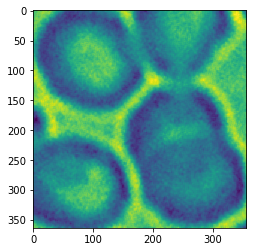

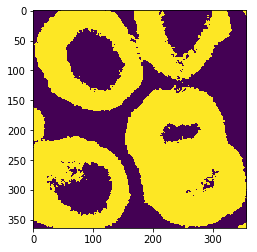

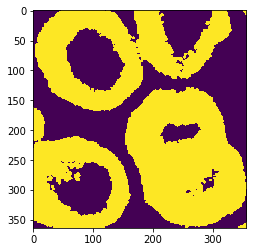

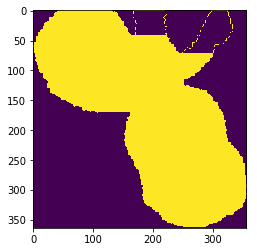

[[[230 192  84]
  [ 98  86  83]
  [236 216  84]
  [264 284  88]
  [ 82  72  80]
  [206 210  82]
  [ 74 292  85]
  [ 98 300  62]
  [116 100  84]
  [210 190  86]
  [286 286  76]
  [ 96 108  72]
  [134  86  70]
  [244 176  64]
  [100 278  70]
  [ 88  52  69]]]


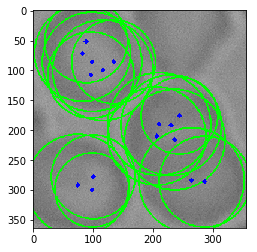

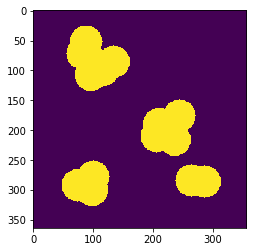

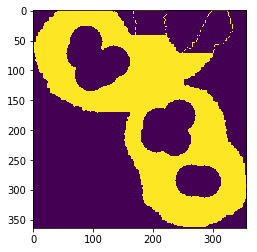

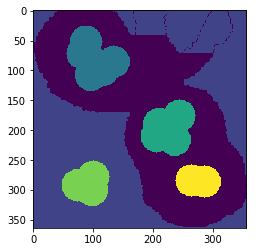

error: OpenCV(3.4.2) C:\Miniconda3\conda-bld\opencv-suite_1534379934306\work\modules\imgproc\src\segmentation.cpp:162: error: (-215:Assertion failed) src.size() == dst.size() in function 'cv::watershed'


In [50]:
#Seperating overlapping objects
k=392
#Hough circle transform 
def find_sure_fg(img):
        
    cimg = cv2.cvtColor(img,cv2.COLOR_GRAY2BGR)
    img = cv2.medianBlur(img,5)
    circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,
                                param1=35,param2=15,minRadius=60,maxRadius=90)
    
    circles = np.uint16(np.around(circles))
    sure_fg=np.zeros(np.shape(img))
    print(circles)
    for i in circles[0,:]:
          # draw the outer circle
        cv2.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)
        # draw the center of the circle
        cv2.circle(cimg,(i[0],i[1]),2,(0,0,255),3)
        cv2.circle(sure_fg,(i[0],i[1]),2,255,50)
    sure_fg = np.uint8(sure_fg)
    plt.imshow(cimg)
    plt.show()

    return(sure_fg)
    

#Hough and watershed
img_mult_bw= multidict[k]
img2=multidict[k]
cnt=contourdict[k]
[x,y,w,h]=pointdict[k]
kernel = np.ones((5,5),np.float32)/25
img_mult_bw = cv2.filter2D(img_mult_bw,-1,kernel)
plt.imshow(img_mult_bw)
plt.show()

ret, thresh = cv2.threshold(img_mult_bw,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
plt.imshow(thresh)
plt.show()

# noise removal
kernel = kernel1
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 1)
plt.imshow(opening)
plt.show()

# sure background area
sure_bg=np.zeros(np.shape(img_v))
cv2.fillConvexPoly(sure_bg,cnt, 255)
sure_bg=sure_bg[int(y):int(y+h),int(x):int(x+w)]
sure_bg = np.uint8(sure_bg)
plt.imshow(sure_bg)
plt.show()

# Finding sure foreground area
sure_fg=find_sure_fg(img2)
plt.imshow(sure_fg)
plt.show()


# Finding unknown region

unknown = cv2.subtract(sure_bg,sure_fg)
plt.imshow(unknown)
plt.show()

# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0

plt.imshow(markers)
plt.show()

markers = cv2.watershed(cimg,markers)
img_mult_bw[markers == -1] = 0
plt.imshow(img_mult_bw)
plt.show()

plt.imshow(markers)
plt.show()

In [15]:
def hough(img): #Hough circle transform 
   
    try:
     
        img = cv2.medianBlur(img,7)
        circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,param1=30,param2=15,minRadius=60,maxRadius=90)
        store=np.zeros(np.shape(circles[0,:])[0])+1
        for n in range(np.shape(store)[0]):
            i=circles[0,n]
            for j in range(n):
                if store[j]==1:
                    other=circles[0,j]
                    if (other[0]-i[0])**2+(other[1]-i[1])**2 < 100**2:
                        store[n]=0
        #                 print(other[0],i[0])
        #                 print(other[1],i[1])
        #                 print((other[0]-i[0]),(other[1]-i[1]) )
        #                 print((other[0]-i[0])**2,(other[1]-i[1])**2 )



        store=np.array(store, dtype=np.bool)
        circles2=circles[0,:]
        circles2= circles2[store,:]
        circles2 = np.uint16(np.around(circles2))


        return(circles2)
    except Exception:# NEED TO SORT THIS!!!!!!!!!!!!!!!!
        return()